In [6]:
%matplotlib inline

import os
import glob
from matplotlib import pyplot as plt
from matplotlib import cm
import numpy as np
import pandas as pd
import piff
from piff import Star
import fitsio
from piff.des.decaminfo import DECamInfo
decaminfo = DECamInfo()

# Study files that are currently used, prior to March 2021...

In [3]:
# look at files that are currently used...
# only using FITS files
outdir = '/nfs/slac/kipac/fs1/g/des/aresh/lower_order_reference_wavefront_folder/'
donuts_filename = outdir + "Science-20140212s2-v22i2.fits"

donutfits = fitsio.FITS(donuts_filename)

In [3]:
print(donutfits)
print(donutfits[1])


  file: /nfs/slac/kipac/fs1/g/des/aresh/lower_order_reference_wavefront_folder/Science-20140212s2-v22i2.fits
  mode: READONLY
  extnum hdutype         hduname[v]
  0      IMAGE_HDU       
  1      BINARY_TBL      

  file: /nfs/slac/kipac/fs1/g/des/aresh/lower_order_reference_wavefront_folder/Science-20140212s2-v22i2.fits
  extension: 1
  type: BINARY_TBL
  rows: 523663
  column info:
    index               i8  
    chip                S0  vstring[3]
    focal_x             f8  
    focal_y             f8  
    z4                  f8  
    w4                  f8  
    expid               S0  vstring[24]
    w5                  f8  
    z5                  f8  
    w11                 f8  
    z11                 f8  
    w14                 f8  
    z14                 f8  
    w15                 f8  
    z15                 f8  
    z6                  f8  
    z8                  f8  
    z7                  f8  
    z9                  f8  
    z10                 f8  
    w6    

In [38]:
print(donutfits[1][0])

(0, 'S1', -25.4655, -176.0925, 0.00671039, 1., 'Science-20140212s2-v22i2', 1., -0.04379, 1., -0.03377, 0.41573, 0.09501, 0.5351, -0.06807, 0.04626, -0.1727, 0.00159, -0.13559, -0.28699, 1., 1., 1., 1., 1., 25, 25, 453., 3086.)


## Conclusions:
looks like identical information in the h5 and fits file
lets check on the values and see which files they came from: 
   
   >  /u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/z4Mesh_Science-20140212s2-v22i2_All.dat
   
   or 
   
   >   /u/ec/roodman/Astrophysics/Donuts/ComboMeshesv22/z4Mesh_Science-20140212s2-v22i2_All.dat
   
and not the previous versions in:
   
   >  /u/ec/roodman/Astrophysics/Donuts/ComboMeshesv22/z4Mesh_Science-20140212s2-v22i2_All.dat

# Read in Donut files, getting newest and older versions

In [4]:
def readDonutFile(fileName):
    dataPoints = pd.read_csv(fileName, delim_whitespace=True,
                        header=None,
                        dtype={'Sensor': '|S', 'x': np.float64, 'y': np.float64,
                                   'z': np.float64, 'w': np.float64},
                        names=['Sensor', 'x', 'y', 'z', 'w'])
    return dataPoints


In [5]:
z4mesh_new = readDonutFile('/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/z4Mesh_Science-20140212s2-v22i2_All.dat')

In [6]:
z4mesh_newi1 = readDonutFile('/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxv22/z4Mesh_Science-20140212s2-v22i2_All.dat')

In [7]:
z4mesh_old = readDonutFile('/u/ec/roodman/Astrophysics/Donuts/ComboMeshesv22/z4Mesh_Science-20140212s2-v22i2_All.dat')

In [8]:
print(z4mesh_new.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 459189 entries, 0 to 459188
Data columns (total 5 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Sensor  459189 non-null  object 
 1   x       459189 non-null  float64
 2   y       459189 non-null  float64
 3   z       459189 non-null  float64
 4   w       459189 non-null  float64
dtypes: float64(4), object(1)
memory usage: 17.5+ MB
None


In [9]:
print(z4mesh_newi1.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 523663 entries, 0 to 523662
Data columns (total 5 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Sensor  523663 non-null  object 
 1   x       523663 non-null  float64
 2   y       523663 non-null  float64
 3   z       523663 non-null  float64
 4   w       523663 non-null  float64
dtypes: float64(4), object(1)
memory usage: 20.0+ MB
None


In [10]:
print(z4mesh_old.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 504426 entries, 0 to 504425
Data columns (total 5 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Sensor  504426 non-null  object 
 1   x       504426 non-null  float64
 2   y       504426 non-null  float64
 3   z       504426 non-null  float64
 4   w       504426 non-null  float64
dtypes: float64(4), object(1)
memory usage: 19.2+ MB
None


## From number of entries, OptAtmo got these from the ComboMeshesZemaxv22 area

This is not quite the correct set of files to use. Want to use the ComboMeshesZemaxIteration2v22 files instead. Review the pickle files made, check they have the correct info (same as .dat files), and make FITS files with the variables and names used in OptAtmo


Need to remind myself of the difference between ComboMeshesZemaxv22 and ComboMeshesZemaxIteration2v22 (?)

# Check on Pickles and Dat files

In [11]:
# try the pickle file
meshes_pkl = pd.read_pickle("/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/ComboMesh_Science-20140212s2-v22i2_All.pkl")

In [12]:
print(meshes_pkl.columns[0:100])
print(meshes_pkl.columns[100:])
print(meshes_pkl.info())

Index(['index', 'EXTEND', 'IFILE', 'FILTER', 'OBSID', 'OBSTYPE', 'ZD', 'HA',
       'EXPTIME', 'RA', 'DEC', 'MSURTEMP', 'MAIRTEMP', 'MJD-OBS', 'EXTNAME',
       'IX', 'IY', 'X_IMAGE', 'Y_IMAGE', 'ISTAMP', 'XDECAM', 'YDECAM',
       'SEX_FLUX', 'SEX_FLGS', 'SEX_ELPT', 'SEX_AVEI', 'CHI2', 'DOF',
       'FITSTAT', 'CLKTIME', 'NCALCALL', 'NCALCDER', 'NELE', 'RZERO', 'BKGD',
       'ZERN2', 'ZERN3', 'ZERN4', 'ZERN5', 'ZERN6', 'ZERN7', 'ZERN8', 'ZERN9',
       'ZERN10', 'ZERN11', 'ZERN12', 'ZERN13', 'ZERN14', 'ZERN15', 'ZERN16',
       'ZERN17', 'ZERN18', 'ZERN19', 'ZERN20', 'ZERN21', 'ZERN22', 'ZERN23',
       'ZERN24', 'ZERN25', 'ZERN26', 'ZERN27', 'ZERN28', 'ZERN29', 'ZERN30',
       'ZERN31', 'ZERN32', 'ZERN33', 'ZERN34', 'ZERN35', 'ZERN36', 'ZERN37',
       'NELEE', 'RZEROE', 'BKGDE', 'ZERN2E', 'ZERN3E', 'ZERN4E', 'ZERN5E',
       'ZERN6E', 'ZERN7E', 'ZERN8E', 'ZERN9E', 'ZERN10E', 'ZERN11E', 'ZERN12E',
       'ZERN13E', 'ZERN14E', 'ZERN15E', 'ZERN16E', 'ZERN17E', 'ZERN18E',
       'ZERN

In [21]:
print(meshes_pkl[['XDECAM','YDECAM','X_IMAGE','Y_IMAGE','IX','IY']])
# so X_IMAGE,Y_IMAGE are pixel number including the overscan - while IX,IY are the true pixel numbers

          XDECAM    YDECAM X_IMAGE Y_IMAGE    IX    IY
0       -25.4655 -176.0925     509    3137   453  3086
1       -30.6555 -176.4225     163    3115   107  3064
2       -16.5555 -177.3225    1103    3055  1047  3004
3        -6.5505 -177.8625    1770    3019  1714  2968
4        -9.0105 -178.9425    1606    2947  1550  2896
...          ...       ...     ...     ...   ...   ...
632516  187.6905   36.4175    1193     267  1137   216
632517  196.1205   35.2775    1755     191  1699   140
632518  183.3105   34.3175     901     127   845    76
632519  188.9955   92.9225    1280    4034  1224  3983
632520  175.2555   92.7425     364    4022   308  3971

[632521 rows x 6 columns]


459189


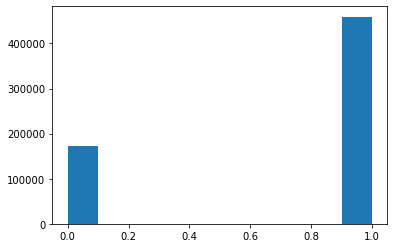

In [18]:
# check the flagFinal, to find which were used...

f,ax = plt.subplots(1,1)
h = ax.hist(meshes_pkl['flagFinal'].astype(int))

ok = meshes_pkl['flagFinal']
meshes_ok = meshes_pkl[ok]
z4ok = meshes_ok['ZERN4']
print(len(z4ok))

## So there are 459189 entries in the .dat files, matching the number of entries where finalFlag==True

In [14]:
# also have a pickle file: ComboMeshesZemaxIteration2v22/Science-20140212s2-v22i2_All.pickle  what is in that one?
# this has all the donutana stuff - raw Meshes and values from the Fits, etc...

# try the pickle file
meshes_pickle = pd.read_pickle("/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20140212s2-v22i2_All.pickle")

Welcome to JupyROOT 6.20/04


In [15]:
print(meshes_pickle.keys())
print(meshes_pickle[284601].keys())
print(meshes_pickle[284601]['z4ResultDict'].keys())

dict_keys([284601, 284602, 284603, 284604, 284605, 284606, 284607, 284608, 284609, 284610, 284611, 284612, 284613, 284614, 284615, 284616, 284617, 284618, 284619, 284620, 284621, 284622, 284623, 284624, 284625, 284626, 284627, 284628, 284629, 284630, 284631, 284632, 284633, 284634, 284635, 284636, 284637, 284638, 284639, 284640, 284641, 284642, 284643, 284644, 284645, 284646, 284647, 284648, 284649, 284650, 284651, 284652, 284653, 284654, 284655, 284656, 284657, 284658, 284659, 284660, 284661, 284662, 284663, 284664, 284665, 284666, 284667, 284668, 284669, 284670, 284671, 284672, 284673, 284674, 284675, 284676, 284677, 284678, 284679, 284680, 284681, 284682, 284683, 284684, 284685, 284686, 284687, 284688, 284689, 284690, 284691, 284692, 284693, 284694, 284695, 284696, 284697, 284698])
dict_keys(['dodz', 'dodzErr', 'dodx', 'dody', 'doxt', 'doyt', 'dodxErr', 'dodyErr', 'doxtErr', 'doytErr', 'donut_summary', 'z4ResultDict', 'z5ResultDict', 'z6ResultDict', 'z7ResultDict', 'z8ResultDict', '

In [16]:
print(meshes_pickle[284601]['z4Mesh'].pointsArray['S4'])
print(len(meshes_pickle[284601]['z4Mesh'].pointsArray['S4']))

# 66 entires in Image 284601 and sensor S4 matches the .pkl file with the DataFrame...

[[-24.9105      16.4775     -43.22983807   1.        ]
 [-12.4755      14.4225     -48.86032807   1.        ]
 [-12.1455      12.9675     -61.96392807   0.91539673]
 [-28.2555      12.6225     -34.80263807   1.        ]
 [-22.9305      12.5775     -52.20705807   1.        ]
 [ -7.7055      11.5725     -62.28391807   0.97469311]
 [-25.6605      10.4025     -47.48871807   1.        ]
 [-29.8905      10.3875     -47.39001807   1.        ]
 [-18.9855       9.7425     -59.52446807   0.95769093]
 [-29.7405       9.3225     -37.17375807   1.        ]
 [ -5.8005       9.0375     -65.68497807   0.77941722]
 [-17.6805       7.0425     -49.11776807   1.        ]
 [-13.9455       6.4875     -60.27517807   1.        ]
 [-22.7205       5.8275     -47.30261807   1.        ]
 [ -6.4905       5.4075     -59.68660807   1.        ]
 [-21.2055       3.6975     -48.69927807   1.        ]
 [ -7.5105       3.9675     -60.99731807   1.        ]
 [ -9.4455       2.4375     -44.75049807   1.        ]
 [-19.7205

# make FITS files for PIFF/OptAtmo from PKL file

In [144]:
# code to make FITS files, now from PKL file
def mesh_maker(mesh_name,pklname,out_dir):


    # get input pkl file
    meshes_input = pd.read_pickle(pklname)
    
    # select only good entries
    ok = meshes_input['flagFinal']
    meshes_good = meshes_input[ok]
    print(mesh_name," length is ",len(meshes_good))

    # make new data frame with desired columns
    # make new data frame with desired columns
    listCols = ['z4corr','z5corr','z6corr','z7corr','z8corr','z9corr','z10corr','z11corr',
                'z14corr','z15corr','IX','IY','EXTNAME','XDECAM','YDECAM']
    df = meshes_good.filter(listCols)

    # rename columns
    colmap = {'z4corr':'z4raw','z5corr':'z5','z6corr':'z6','z7corr':'z7','z8corr':'z8',
          'z9corr':'z9','z10corr':'z10','z11corr':'z11','z14corr':'z14','z15corr':'z15',
          'IX':'x','IY':'y','XDECAM':'focal_x','YDECAM':'focal_y','EXTNAME':'chip'}
    dfnew = df.rename(columns=colmap)

    # scale from DeltaZ[microns] to wavefront, and also scale from moving all of DECam to just the Focal plane
    dfnew['z4'] = dfnew['z4raw'] * ( (8.7/1500.0) / 1.189 )
    
    # get chipnum 
    dfnew['ccdnum'] = np.array([decaminfo.infoDict[achip]['CCDNUM'] for achip in dfnew['chip']])
    dfnew['chipnum'] = dfnew['ccdnum']

    # fill the Donut sequence here
    dfnew['expid'] = 'Science-20140212s2-v22i2'
    
    # add weights, but set all of them to 1.0 now...
    dfnew['w4'] = 1.
    dfnew['w5'] = 1.
    dfnew['w6'] = 1.
    dfnew['w7'] = 1.
    dfnew['w8'] = 1.
    dfnew['w9'] = 1.
    dfnew['w10'] = 1.
    dfnew['w11'] = 1.
    dfnew['w14'] = 1.
    dfnew['w15'] = 1.    
 
    # save to FITS
    recarray = dfnew.to_records(column_dtypes={"x": "int32","y":"int32","chip":"S3",'expid':'S30'})
    filename = '{0}/{1}.fits'.format(out_dir, mesh_name)
    print(filename," written with ",len(recarray)," columns")
    fitsio.write(filename, recarray, clobber=True)



<pre>
Here are the pkl files to use for the v22i2 versions 

20121120s1 and 20151026s2 are r band
20140212s2 is i band
20181218s1 is z band
20181218s2 is g band

[roodman@cent7b:Donuts]$ ls -l ComboMeshesZemaxIteration2v22/*.pkl
-rw-r--r--. 1 roodman ec  341150206 Feb 20  2019 ComboMeshesZemaxIteration2v22/ComboMesh_Science-20121120s1-v22i2_All.pkl
-rw-r--r--. 1 roodman ec 1178156989 Feb 20  2019 ComboMeshesZemaxIteration2v22/ComboMesh_Science-20140212s2-v22i2_All.pkl
-rw-r--r--. 1 roodman ec  559905158 Jan 23  2019 ComboMeshesZemaxIteration2v22/ComboMesh_Science-20151026s2-v22i2_All.pkl
-rw-r--r--. 1 roodman ec 1137209378 Feb 20  2019 ComboMeshesZemaxIteration2v22/ComboMesh_Science-20181218s1-v22i2_All.pkl
-rw-r--r--. 1 roodman ec 1012524037 Feb 20  2019 ComboMeshesZemaxIteration2v22/ComboMesh_Science-20181218s2-v22i2_All.pkl

</pre>

In [145]:
# make FITS files from Donut pkl files

bandpkl = {'i':'20140212s2','r':'20121120s1','z':'20181218s1','g':'20181218s2','r2':'20151026s2'}

for aband in bandpkl.keys():
    name = bandpkl[aband]
    pklname = "/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/ComboMesh_Science-%s-v22i2_All.pkl" % (name)
    out_dir = "/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22"
    mesh_maker(mesh_name='Science-%s-v22i2' % (name),pklname=pklname,out_dir=out_dir)

Science-20140212s2-v22i2  length is  459189
/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20140212s2-v22i2.fits  written with  459189  columns
Science-20121120s1-v22i2  length is  32581
/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20121120s1-v22i2.fits  written with  32581  columns
Science-20181218s1-v22i2  length is  269141
/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20181218s1-v22i2.fits  written with  269141  columns
Science-20181218s2-v22i2  length is  252331
/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20181218s2-v22i2.fits  written with  252331  columns
Science-20151026s2-v22i2  length is  150096
/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20151026s2-v22i2.fits  written with  150096  columns


<pre>
[roodman@cent7b:Donuts]$ ls -l /u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/*.fits
-rw-r--r--. 1 roodman ec   8121600 Mar 22 15:02 /u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20121120s1-v22i2.fits
-rw-r--r--. 1 roodman ec 114347520 Mar 22 15:02 /u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20140212s2-v22i2.fits
-rw-r--r--. 1 roodman ec  37385280 Mar 22 15:02 /u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20151026s2-v22i2.fits
-rw-r--r--. 1 roodman ec  67026240 Mar 22 15:02 /u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20181218s1-v22i2.fits
-rw-r--r--. 1 roodman ec  62841600 Mar 22 15:02 /u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/Science-20181218s2-v22i2.fits

</pre>

# Make Plots from FITS files, to check them out...

In [146]:
from meshscripts import plotMeshesDF

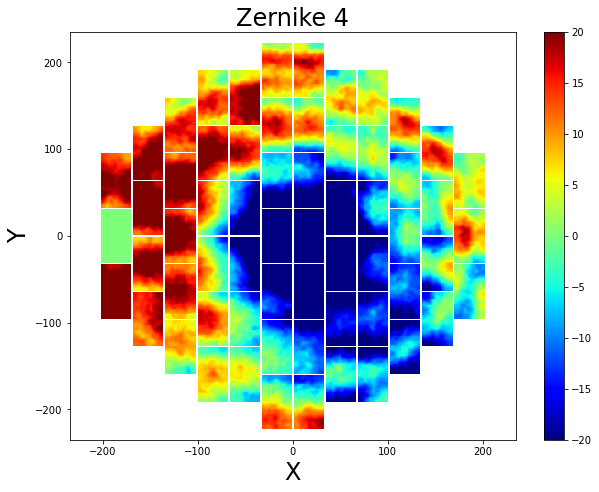

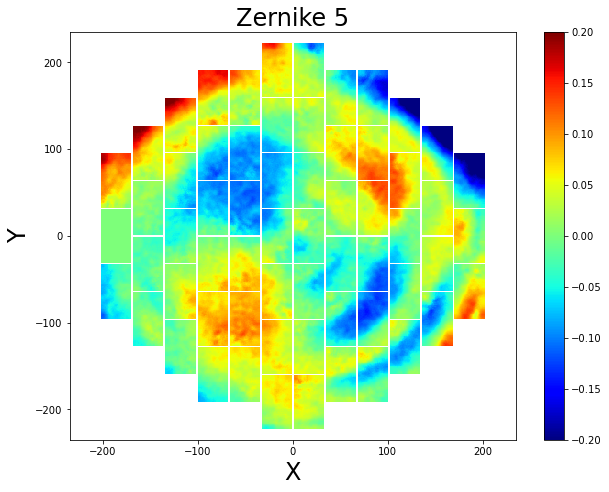

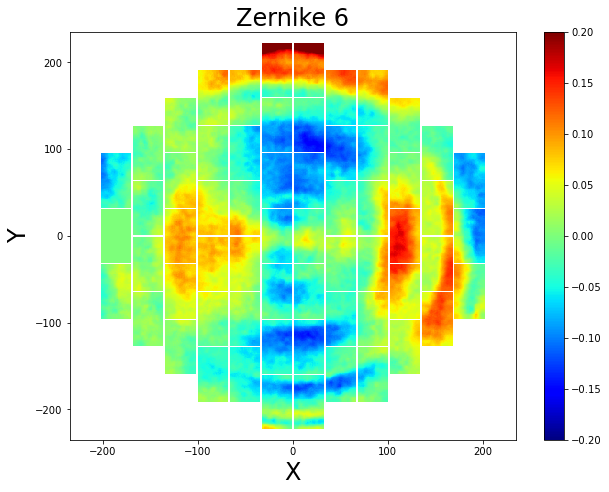

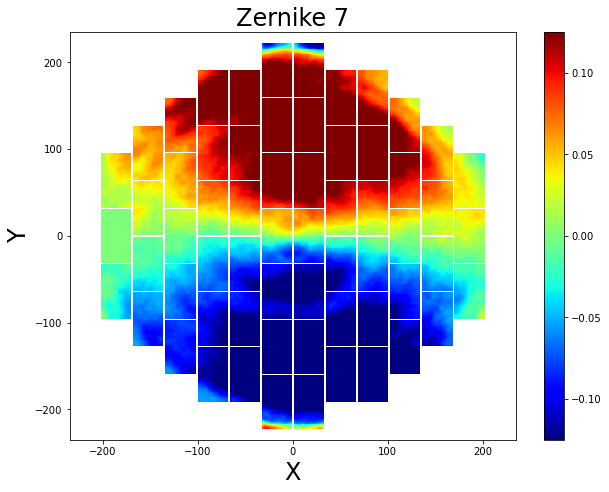

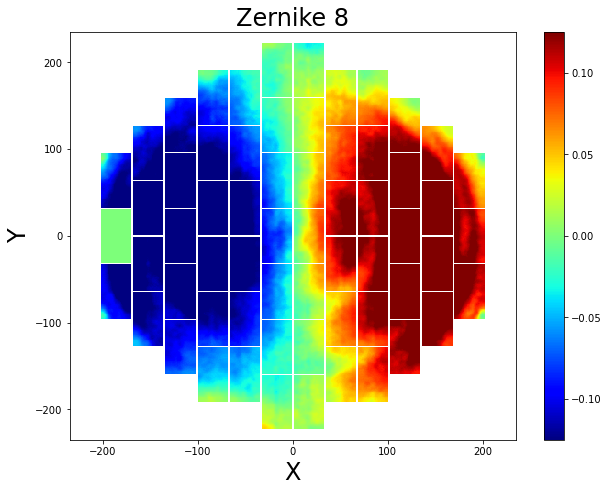

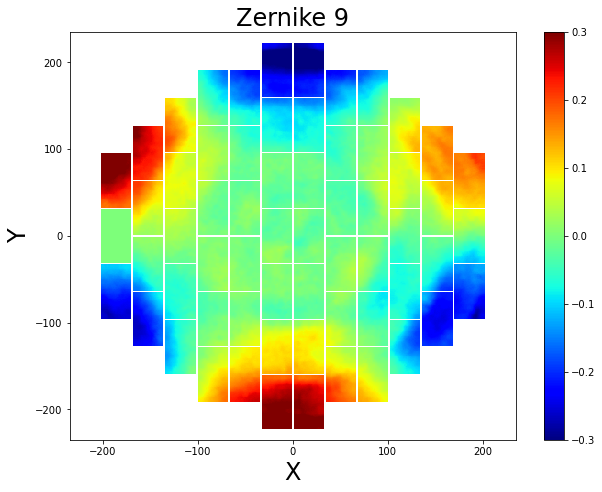

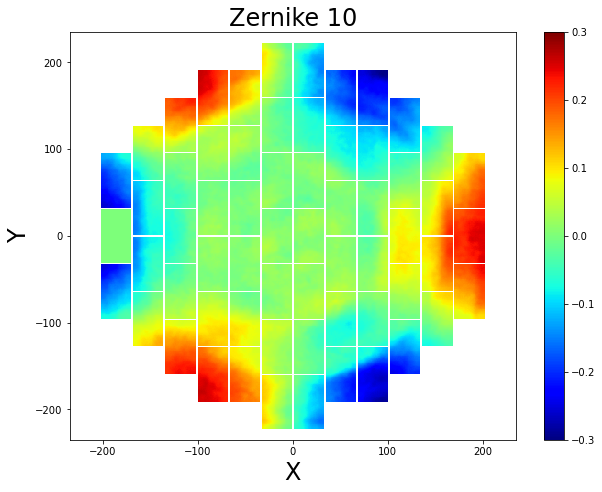

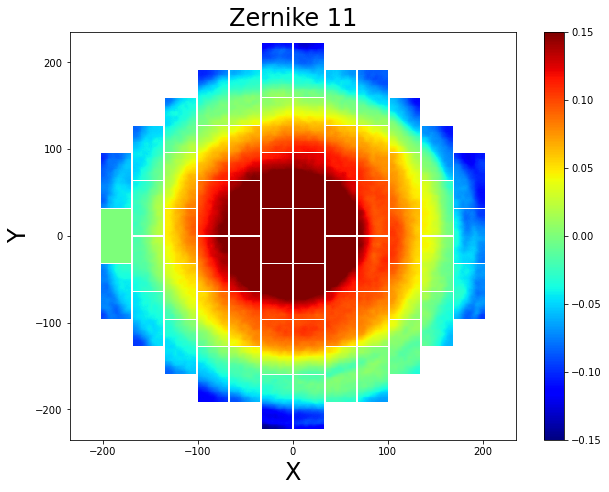

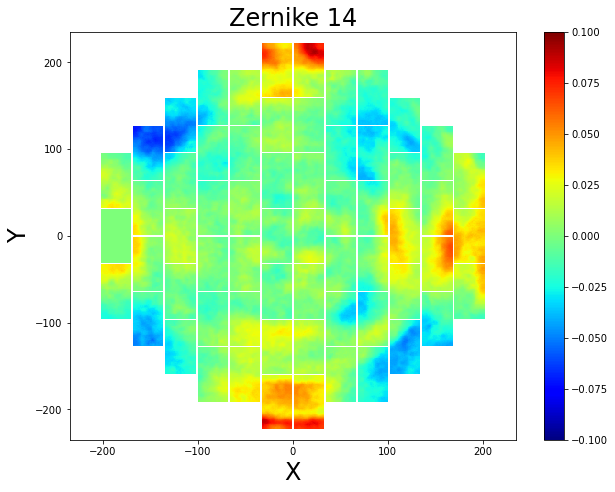

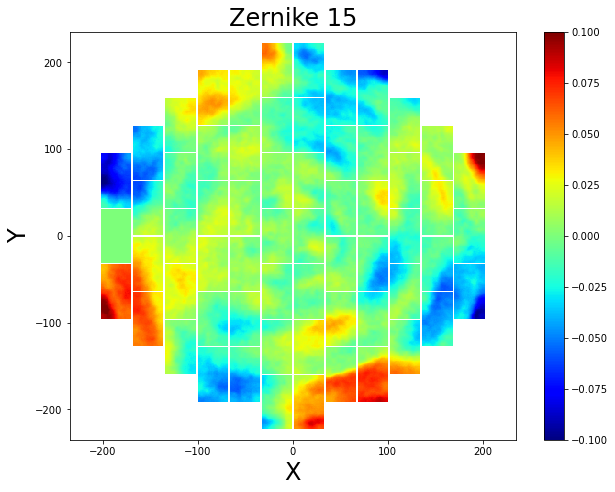

In [148]:
rootdir = '/u/ec/roodman/Astrophysics/Donuts/'
plotMeshesDF(rootdir+"ComboMeshesZemaxIteration2v22","ComboMesh_Science-20140212s2-v22i2_All",interactiveFlag=True,)

In [2]:
# make plots in u,v coordinates instead
# for publication...
from meshscripts import plotMeshesDFPub

Welcome to JupyROOT 6.20/04


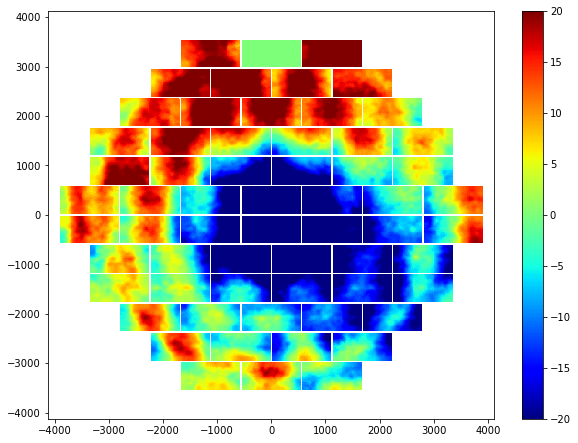

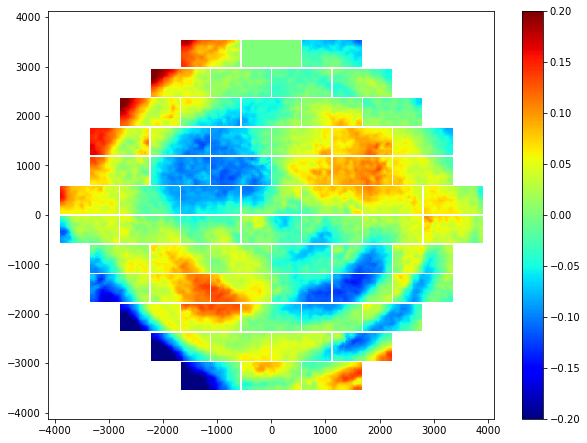

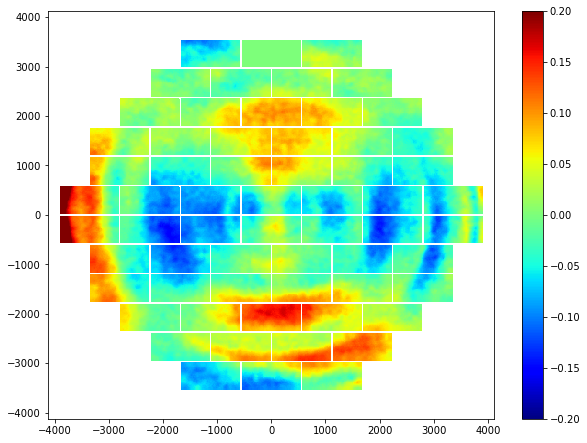

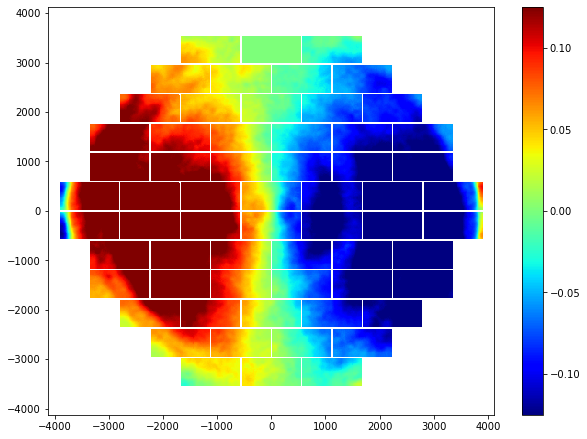

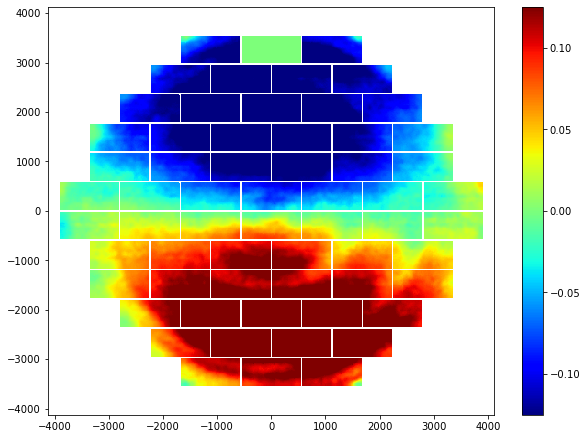

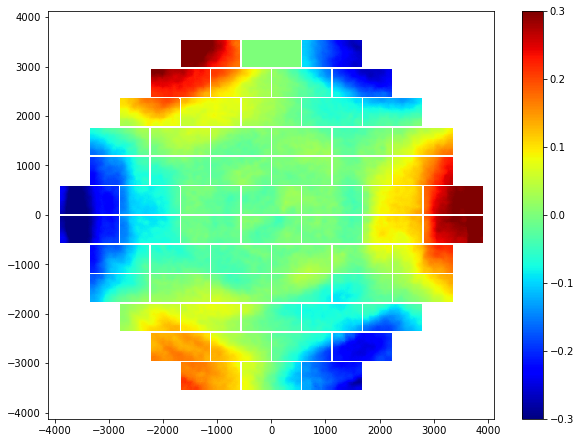

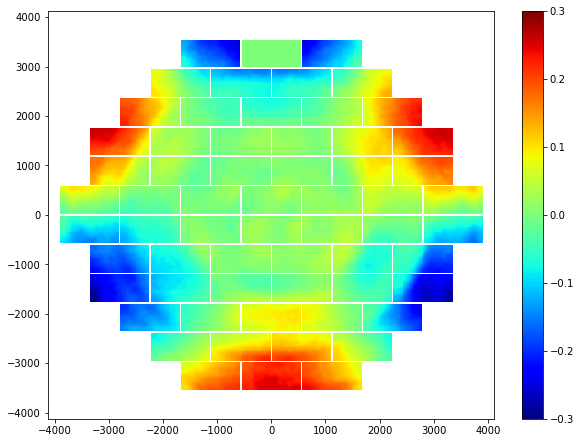

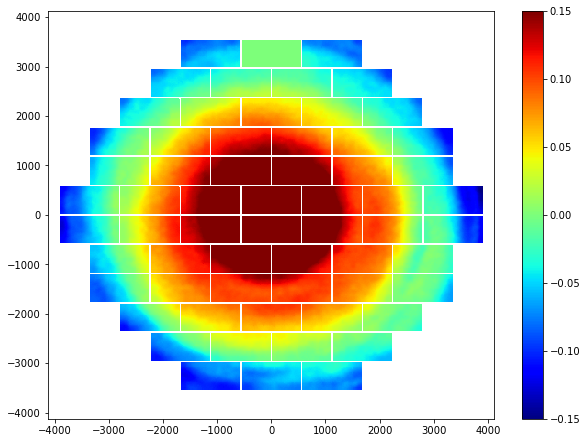

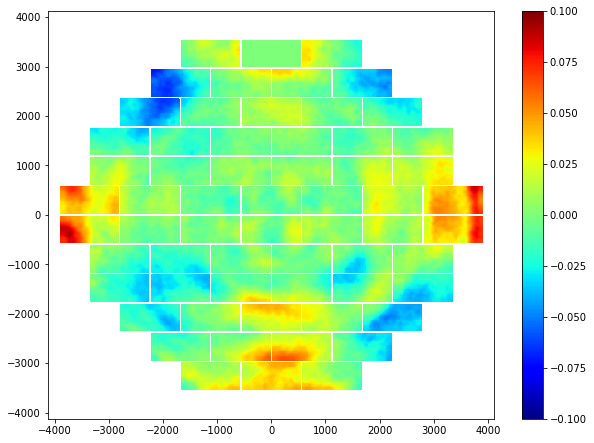

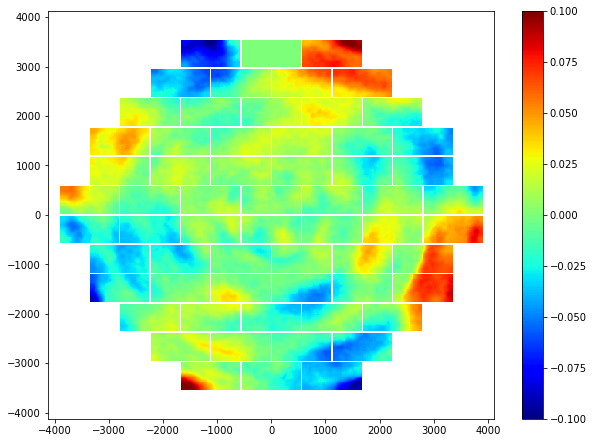

In [5]:
rootdir = '/u/ec/roodman/Astrophysics/Donuts/'
plotMeshesDFPub(rootdir+"ComboMeshesZemaxIteration2v22","ComboMesh_Science-20140212s2-v22i2_All",interactiveFlag=True)

# Compare with plots directly from OptAtmo FITS files

In [12]:
outdir = '/u/ec/roodman/Astrophysics/Donuts/ComboMeshesZemaxIteration2v22/'
newdonuts_filename = outdir + "Science-20140212s2-v22i2.fits"
newfits = fitsio.FITS(newdonuts_filename)
newtable = newfits[1]

# useful numerical factors!
factor = 0.263/0.015
z4factor = ( (8.7/1500.0) / 1.189 )

# get arrays
focal_x = newtable['focal_x'][:]
focal_y = newtable['focal_y'][:]

focal_u = -factor*focal_y
focal_v = -factor*focal_x

a4 = newtable['z4'][:]
a11 = newtable['z11'][:]

# combinations
a5 = newtable['z5'][:]
a6 = newtable['z6'][:]
astig = np.sqrt(a5**2 + a6**2)

a7 = newtable['z7'][:]
a8 = newtable['z8'][:]
coma = np.sqrt(a7**2 + a8**2)

a9 = newtable['z9'][:]
a10 = newtable['z10'][:]
trefoil = np.sqrt(a9**2 + a10**2)

a14 = newtable['z14'][:]
a15 = newtable['z15'][:]
quatrefoil = np.sqrt(a14**2 + a15**2)

magterms = {'astig':astig,'coma':coma,'trefoil':trefoil,'quatrefoil':quatrefoil}

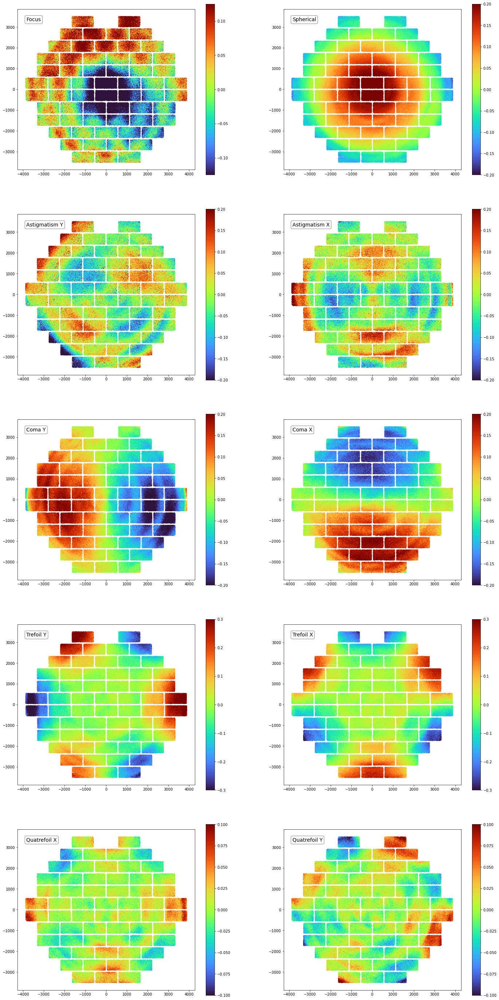

In [11]:
f,ax = plt.subplots(5,2,figsize=(24,50))
axf = ax.flatten()
zs = [4,11,5,6,7,8,9,10,14,15]
ztermname = ['Focus','Spherical','Astigmatism Y','Astigmatism X','Coma Y','Coma X','Trefoil Y','Trefoil X','Quatrefoil X','Quatrefoil Y']
zlim = [0.125,0.2,0.2,0.2,0.2,0.2,0.3,0.3,0.1,0.1]
for i,iz in enumerate(zs):
    im = axf[i].hexbin(focal_u,focal_v,newtable['z%d' % (iz)][:],gridsize=500,cmap=cm.turbo,vmin=-1.*zlim[i],vmax=zlim[i])
    axf[i].set_aspect('equal')
    plt.colorbar(im,ax=axf[i])
    
    textstr = ztermname[i]
    props = dict(boxstyle='round', alpha=0.5, facecolor='white')
    axf[i].text(0.05, 0.95, textstr, transform=axf[i].transAxes,fontsize=14,verticalalignment='top', bbox=props)

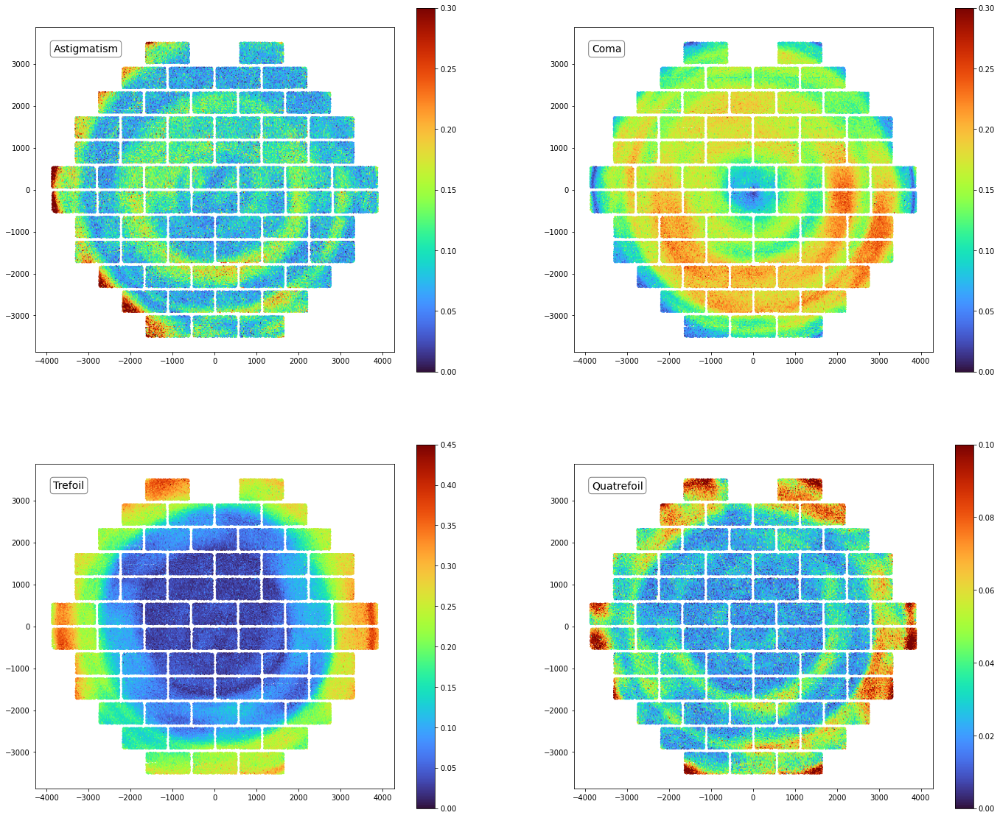

In [14]:
# astig,coma,trefoil,quatrefoil
f,ax = plt.subplots(2,2,figsize=(24,20))
axf = ax.flatten()
zs = ['astig','coma','trefoil','quatrefoil']
ztermname = ['Astigmatism','Coma','Trefoil','Quatrefoil']
zlim = [0.3,0.3,0.45,0.1]
for i,iz in enumerate(zs):
    im = axf[i].hexbin(focal_u,focal_v,magterms[iz],gridsize=500,cmap=cm.turbo,vmin=0.0,vmax=zlim[i])
    axf[i].set_aspect('equal')
    plt.colorbar(im,ax=axf[i])
    
    textstr = ztermname[i]
    props = dict(boxstyle='round', alpha=0.5, facecolor='white')
    axf[i].text(0.05, 0.95, textstr, transform=axf[i].transAxes,fontsize=14,verticalalignment='top', bbox=props)

# Compare against Zemax model

In [15]:
# read in Zemax model
# get value at each Donut location, add variables to the pkl. 
# plot a4-a4zemax vs. u,v -- see how much of the CCD structure is present...
# plot a5-a5zemax etc... compare them all...

from donutlib.wavefrontmap import wavefrontmap
wfmap = wavefrontmap(file="/u/ec/roodman/Astrophysics/Donuts/decam_2012-nominalzernike.pickle")


In [16]:
def getZemaxInterp(x,y,wfmap,iZ):
    # do piecemeal to avoid memory issues
    n = x.shape[0]
    vals = np.zeros(n)
    nmax = 50000
    r = int(np.ceil(n/nmax))
    for i in range(r):
        lo = nmax*i
        hi = lo + 50000
        hi = min(hi,n)
        vals[lo:hi] = wfmap.getArray(x[lo:hi],y[lo:hi],iZactual=iZ)
    return vals

In [17]:
azemax = {}
azemax[4] = getZemaxInterp(focal_x,focal_y,wfmap,iZ=4)
azemax[5] = getZemaxInterp(focal_x,focal_y,wfmap,iZ=5)
azemax[6] = getZemaxInterp(focal_x,focal_y,wfmap,iZ=6)
azemax[7] = getZemaxInterp(focal_x,focal_y,wfmap,iZ=7)
azemax[8] = getZemaxInterp(focal_x,focal_y,wfmap,iZ=8)
azemax[9] = getZemaxInterp(focal_x,focal_y,wfmap,iZ=9)
azemax[10] = getZemaxInterp(focal_x,focal_y,wfmap,iZ=10)
azemax[11] = getZemaxInterp(focal_x,focal_y,wfmap,iZ=11)
azemax[14] = getZemaxInterp(focal_x,focal_y,wfmap,iZ=14)
azemax[15] = getZemaxInterp(focal_x,focal_y,wfmap,iZ=15)

In [18]:
astig_zemax = np.sqrt(azemax[5]**2 + azemax[6]**2)
coma_zemax = np.sqrt(azemax[7]**2 + azemax[8]**2)
trefoil_zemax = np.sqrt(azemax[9]**2 + azemax[10]**2)
quatrefoil_zemax = np.sqrt(azemax[14]**2 + azemax[15]**2)

magterms_zemax = {'astig':astig_zemax,'coma':coma_zemax,'trefoil':trefoil_zemax,'quatrefoil':quatrefoil_zemax}

In [25]:
def plotZthree(data,zemax,vmin,vmax,title,mag=False):
    f,ax = plt.subplots(1,3,figsize=(30,7.5))
    axf = ax.flatten()

    if mag:
        usevmin = 0.
    else:
        usevmin = vmin
        
    im = axf[0].hexbin(focal_u,focal_v,data,gridsize=500,cmap=cm.turbo,vmin=usevmin,vmax=vmax)
    axf[0].set_aspect('equal')
    plt.colorbar(im,ax=axf[0])    
    textstr = title + ", Data"
    props = dict(boxstyle='round', alpha=0.5, facecolor='white')
    axf[0].text(0.025, 0.965, textstr, transform=axf[0].transAxes,fontsize=14,verticalalignment='top', bbox=props)

    im = axf[1].hexbin(focal_u,focal_v,zemax,gridsize=500,cmap=cm.turbo,vmin=usevmin,vmax=vmax)
    axf[1].set_aspect('equal')
    plt.colorbar(im,ax=axf[1])    
    textstr = title + ", Zemax" 
    props = dict(boxstyle='round', alpha=0.5, facecolor='white')
    axf[1].text(0.025, 0.965, textstr, transform=axf[1].transAxes,fontsize=14,verticalalignment='top', bbox=props)

    im = axf[2].hexbin(focal_u,focal_v,data-zemax,gridsize=500,cmap=cm.turbo,vmin=vmin,vmax=vmax)
    axf[2].set_aspect('equal')
    plt.colorbar(im,ax=axf[2])    
    textstr = "Data - Zemax " 
    props = dict(boxstyle='round', alpha=0.5, facecolor='white')
    axf[2].text(0.025, 0.965, textstr, transform=axf[2].transAxes,fontsize=14,verticalalignment='top', bbox=props)
    

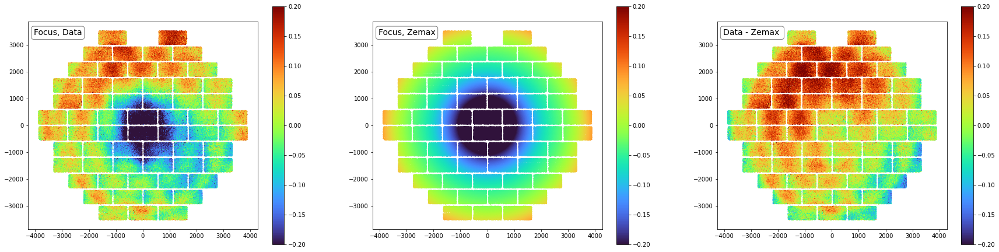

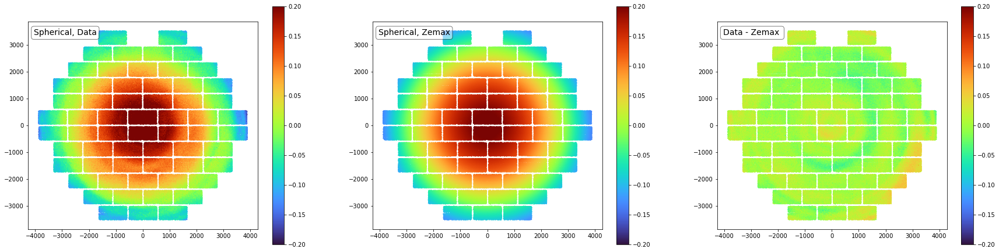

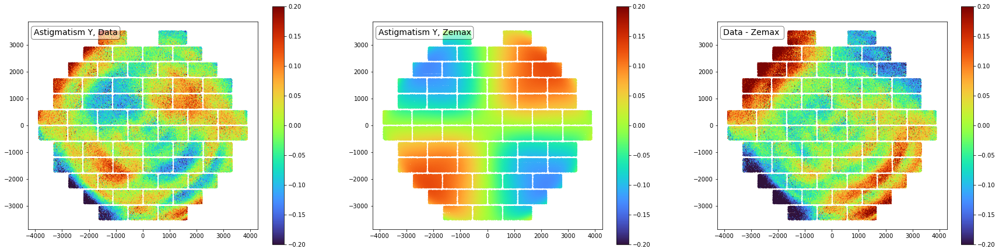

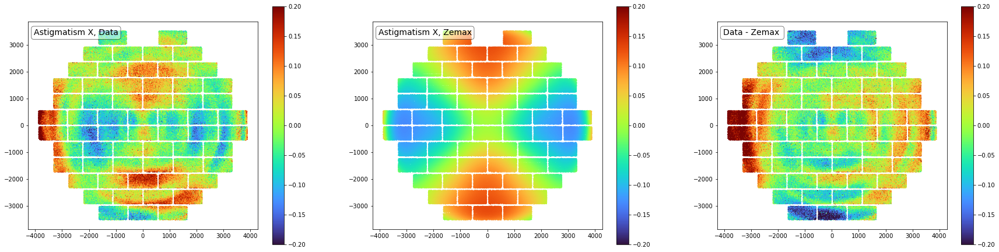

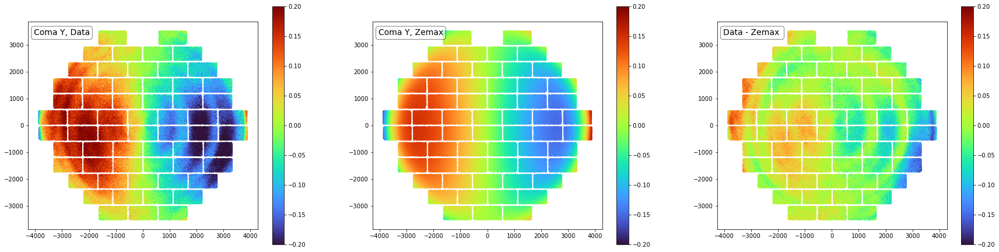

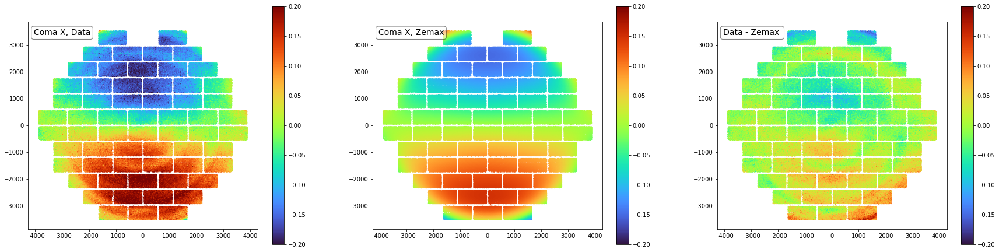

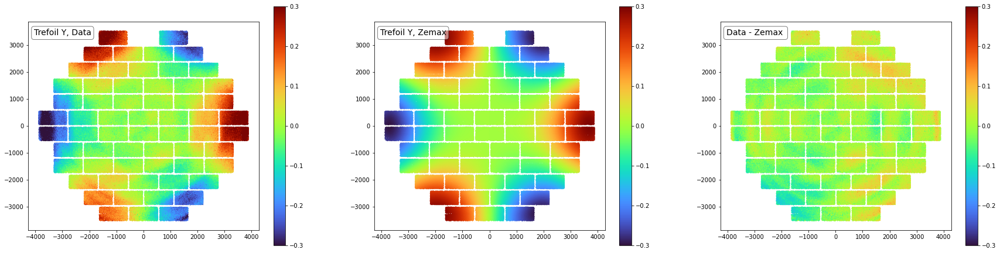

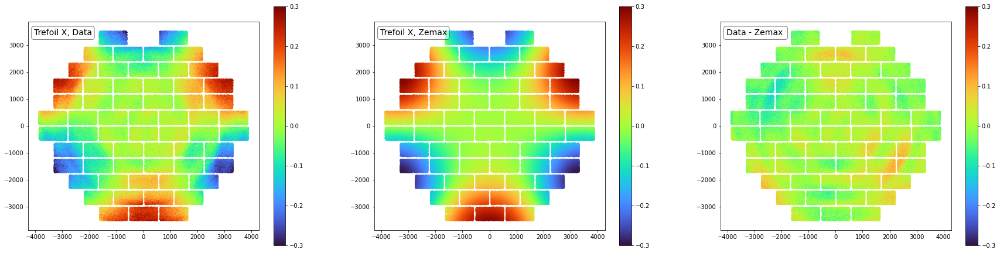

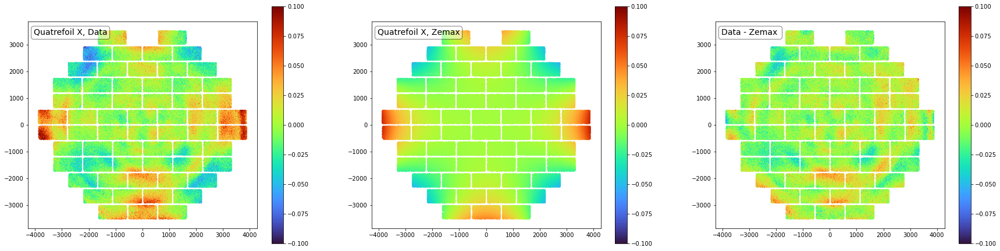

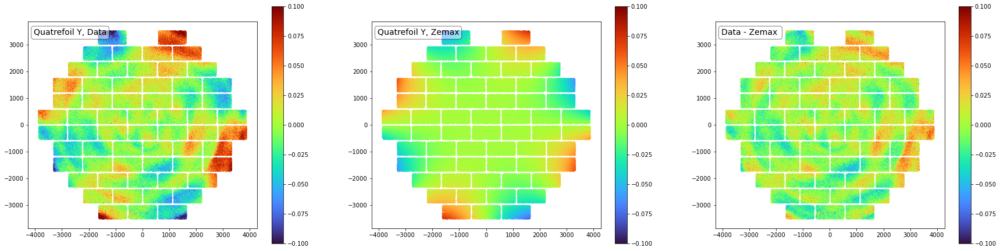

In [24]:
zs = [4,11,5,6,7,8,9,10,14,15]
ztermname = ['Focus','Spherical','Astigmatism Y','Astigmatism X','Coma Y','Coma X','Trefoil Y','Trefoil X','Quatrefoil X','Quatrefoil Y']
zlim = [0.2,0.2,0.2,0.2,0.2,0.2,0.3,0.3,0.1,0.1]
for i,iZ in enumerate(zs):
    plotZthree(newtable['z%d' % (iZ)][:],azemax[iZ],-zlim[i],zlim[i],ztermname[i])

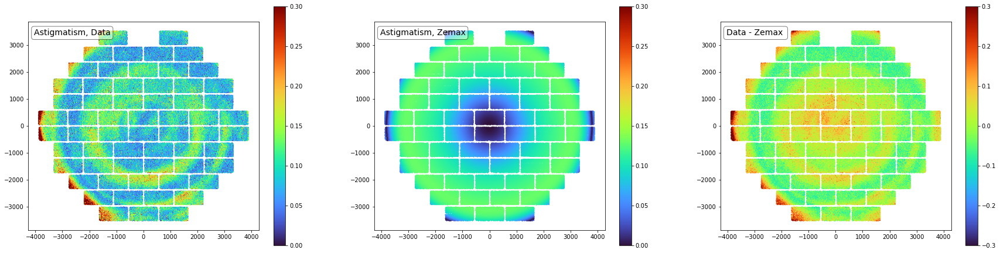

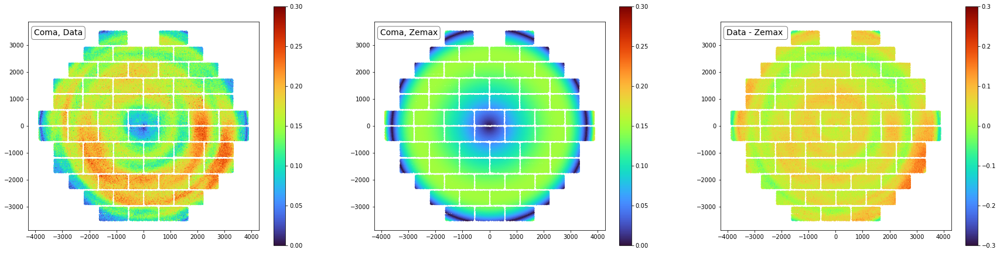

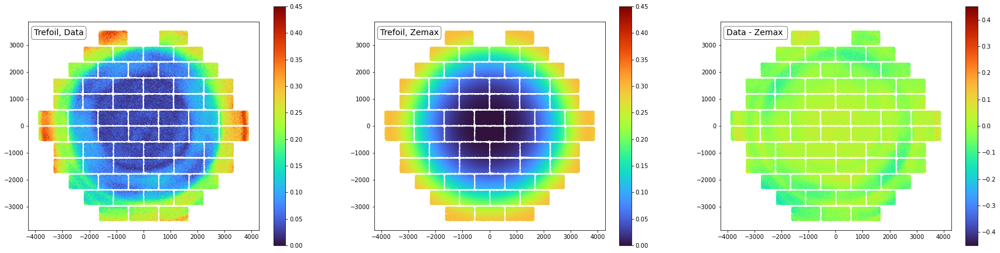

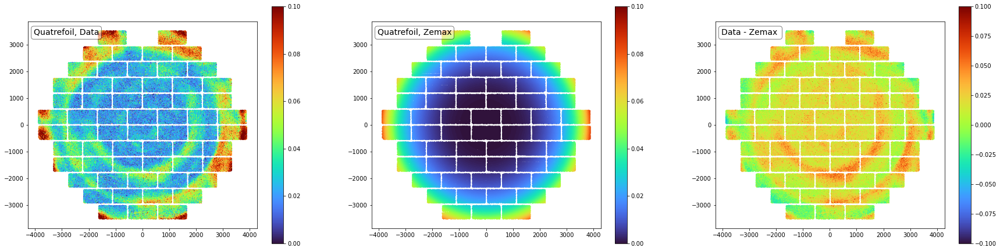

In [29]:
zs = ['astig','coma','trefoil','quatrefoil']
ztermname = ['Astigmatism','Coma','Trefoil','Quatrefoil']
zlim = [0.3,0.3,0.45,0.1]
for i,iZ in enumerate(zs):
    plotZthree(magterms[iZ],magterms_zemax[iZ],-zlim[i],zlim[i],ztermname[i],mag=True)

In [33]:
# 1-D radial plots
from scipy import stats

In [41]:
focal_r = np.sqrt(focal_u**2 + focal_v**2)

astig_means, astig_edges, binnumber = stats.binned_statistic(focal_r,astig-astig_zemax,bins=200,range=(0.,4000.))
astig_centers = (astig_edges[0:-1] + astig_edges[1:])/2.

coma_means, coma_edges, binnumber = stats.binned_statistic(focal_r,coma-coma_zemax,bins=200,range=(0.,4000.))
coma_centers = (coma_edges[0:-1] + coma_edges[1:])/2.

trefoil_means, trefoil_edges, binnumber = stats.binned_statistic(focal_r,trefoil-trefoil_zemax,bins=200,range=(0.,4000.))
trefoil_centers = (trefoil_edges[0:-1] + trefoil_edges[1:])/2.

quatrefoil_means, quatrefoil_edges, binnumber = stats.binned_statistic(focal_r,quatrefoil-quatrefoil_zemax,bins=200,range=(0.,4000.))
quatrefoil_centers = (quatrefoil_edges[0:-1] + quatrefoil_edges[1:])/2.

(-0.1, 0.225)

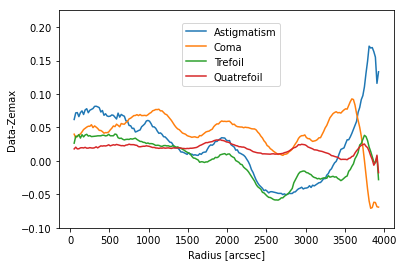

In [60]:
f,ax = plt.subplots(1,1)
h = ax.plot(astig_centers,astig_means,label="Astigmatism")
h = ax.plot(coma_centers,coma_means,label="Coma")
h = ax.plot(trefoil_centers,trefoil_means,label="Trefoil")
h = ax.plot(quatrefoil_centers,quatrefoil_means,label="Quatrefoil")
ax.set_ylabel("Data-Zemax")
ax.set_xlabel("Radius [arcsec]")
f.legend(loc=(0.45,0.675))
ax.set_ylim((-0.1,0.225))